# Installation

Install the necessary packages:
* Upgrade scikit-learn package.
* tensorflow-addons (Advanced tensors operations)
* tf-models-official (Pretrained models)
* dropbox (Cloud storage for the trained models)

Import the libs used in this notebook

In [ ]:
%%capture
!pip install -U scikit-learn
!pip install -U tensorflow-addons
!pip install -U tf-models-official
!pip install -U dropbox

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
import tensorflow_probability as tfpd
import tensorflow_addons as tfa
import tensorflow_hub as hub
import dropbox
import pickle

from tensorflow.keras import applications as apps
from tensorflow.keras import layers, optimizers, metrics
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, LambdaCallback, EarlyStopping
from official.vision.image_classification.augment import RandAugment

from os import path
from google.colab import files
from pathlib import Path
from time import time

# Dataset and metrics visualization

APIs:
* plot_dataset(ds, count, title): The default value of count is 4. The default value of title is 'dataset'.
* plot_acc(history): The history object is returned by the training function.
* plot_loss(history): The history object is returned by the training function.


## Dataset

In [ ]:
def title_color(label):
  color = 'black'

  if isinstance(label, np.ndarray):
    color = 'green' if label[0] == label[1] else 'red'

  return color

def plot_dataset(ds, count=4, title='dataset'):
  size = 4
  cols = 4
  rows = int((count+cols-1) / cols)

  ds_itr = ds.as_numpy_iterator()
  fig = plt.figure(figsize=(size*cols, size*rows))
  items = map(lambda id: (id,) + ds_itr.next(), range(count))

  for id, image, label in items:
    colid = id % cols
    rowid = id / cols

    ax = fig.add_subplot(rows, cols, id+1)

    ax.set_title(label, color=title_color(label))
    ax.imshow(image)
    ax.axis("off")
  
  fig.suptitle(title)
  plt.show()

## Metrics

In [ ]:
def plot_acc(history):
  val = history.history.get('val_accuracy')
  legend = ['train', 'val'] if val else ['train']

  plt.plot(history.history['accuracy'])
  if val: plt.plot(history.history['val_accuracy'])

  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(legend, loc='upper left')
  plt.show()

def plot_loss(history, val=False):
  val = history.history.get('val_loss')
  legend = ['train', 'val'] if val else ['train']

  plt.plot(history.history['loss'])
  if val: plt.plot(history.history['val_loss'])

  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(legend, loc='upper left')
  plt.show()

# Dataset creation

We use the *oxford_flowers102* to demonstrate the sample efficiency improvements. The dataset has integer class labels for the flower images. To identify the flowers by name, use the following links:
 * [Name=>Label](https://gist.github.com/JosephKJ/94c7728ed1a8e0cd87fe6a029769cde1)
 * [Label=>Visual](https://www.robots.ox.ac.uk/~vgg/data/flowers/102/categories.html) 

In this section, we create a **tf.data.Dataset** tensorflow object. We also create a small sample dataset for testing purposes. The dataset elements are formatted as a tuple *(image, class_label)*. We expose the following objects:
* train_prep_ds (Training dataset)
* val_prep_ds (Validation dataset)
* test_prep_ds (Test dataset)
* ds_info (Dataset metadata object)

In [ ]:
from functools import reduce

# Dataset image size
IMG_SIZE = 224

def labelfn(x, y):
  return y

def imagefn(x, y):
  return x

def create_label_filterfn(selection):
  return lambda x, y: tf.reduce_any(tf.equal(y, selection))

def dsitem_to_tuple(item):
  return (item['image'], item['label'])

"""
  Input: (tf.uint8, tf.uint8)
  Returns: (tf.float32, tf.float32)
"""
def normalize_image(image, label):
  return tf.cast(image, tf.float32)/255, label

"""
  Input: (tf.uint8, tf.uint8)
  Returns: (tf.uint8, tf.uint8)
"""
def resize_image(image, label):
  image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])
  image = tf.cast(image, tf.uint8)
  return image, label

def mapchainfn(ds, funcs=[dsitem_to_tuple, resize_image], cache=False):
  result_ds = reduce(lambda y,x: y.map(x), funcs, ds)
  return result_ds.cache() if cache else result_ds

In [ ]:
def make_dataset(name):
  loadfn = lambda x: tfds.load(name, split=x, with_info=True)

  train_ds, ds_info = loadfn('train')

  datasets = map(lambda x: (x, loadfn(x)[0]), ds_info.splits)
  datasets = {name:value for name, value in datasets}

  train_ds, val_ds, test_ds = datasets.get('train'), datasets.get('validation'), datasets.get('test')

  fig = tfds.show_examples(train_ds, ds_info)

  return train_ds, val_ds, test_ds, ds_info

## Load and format datasets

We download the dataset and create *three* tf.data.Dataset objects for training, validation and testing purpose.
* train_ds: Training dataset
* val_ds: Validation dataset
* test_ds: Test dataset
* ds_info: Dataset metadata

Then, we format the dataset elements into a familiar tuple format (image, label). We also resize all the images to a fixed size. The formatted and resized dataset are:
* train_prep_ds: Training dataset
* val_prep_ds: Validation dataset
* test_prep_ds: Test dataset

In [ ]:
%%capture
train_ds, val_ds, test_ds, ds_info = make_dataset('oxford_flowers102')

In [ ]:
ds_info

tfds.core.DatasetInfo(
    name='oxford_flowers102',
    version=2.1.1,
    description='The Oxford Flowers 102 dataset is a consistent of 102 flower categories commonly occurring
in the United Kingdom. Each class consists of between 40 and 258 images. The images have
large scale, pose and light variations. In addition, there are categories that have large
variations within the category and several very similar categories.

The dataset is divided into a training set, a validation set and a test set.
The training set and validation set each consist of 10 images per class (totalling 1020 images each).
The test set consists of the remaining 6149 images (minimum 20 per class).',
    homepage='https://www.robots.ox.ac.uk/~vgg/data/flowers/102/',
    features=FeaturesDict({
        'file_name': Text(shape=(), dtype=tf.string),
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=102),
    }),
    total_num_examples=8

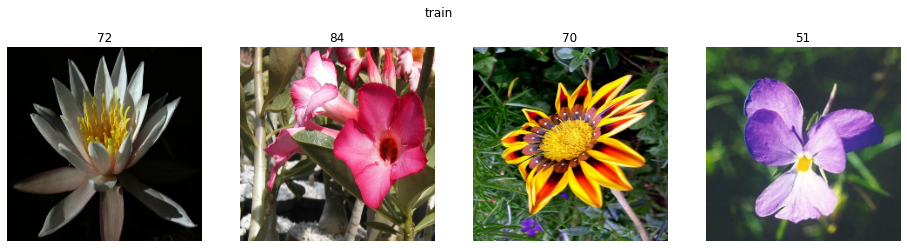

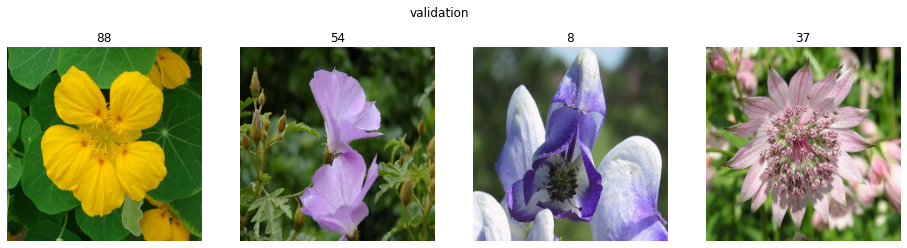

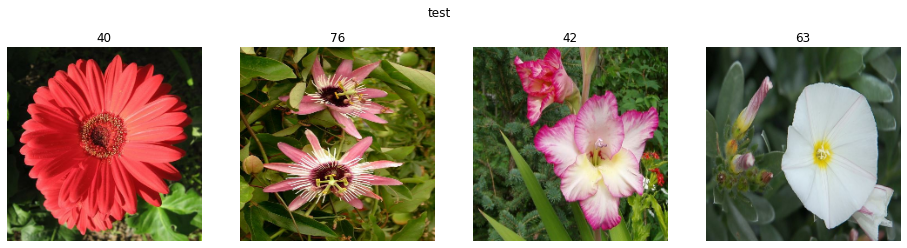

In [ ]:
# Format the datasets
train_prep_ds = mapchainfn(train_ds, cache=True)
val_prep_ds = mapchainfn(val_ds, cache=True) if val_ds else None
test_prep_ds = mapchainfn(test_ds, cache=True)

plot_dataset(train_prep_ds, title='train')
plot_dataset(val_prep_ds, title='validation')
plot_dataset(test_prep_ds, title='test')

# Initialize the datastore

We use dropbox cloud to store models and traning metrics. In this section, we provide APIs to interact with the cloud. We have two identifiers. The first one is PROJECT which refers to the name of the project. The second identifier, *experiment*, represents the experiment name. For example, we can call the project "sample_efficiency_mobilenet". There could be several experiements in the project such as "baseline" or "basicaug".



In [ ]:
PROJECT = 'sample_efficiency_mobilenet'
CHKPT_DIR = 'chkpt'
HISTORY_DIR = 'hist'
INITIAL_WEIGHTS = 'initial_weights.h5'
DBX = dropbox.Dropbox()

def dbx_download(local_path, remote_path):
  DBX.files_download_to_file(local_path, remote_path)
  return local_path

def dbx_upload(local_path, remote_path, overwrite=False):
  with open(local_path, 'rb') as f:
    DBX.files_upload(f.read(), remote_path, mode=dropbox.files.WriteMode.overwrite if overwrite else None)
  return remote_path

def dbx_latest_filter(item):
  return item.server_modified

def dbx_latest_history(experiment):
  hist_path = path.join('/', PROJECT, experiment, HISTORY_DIR)
  info = DBX.files_list_folder(hist_path)
  latest = max(info.entries, key=dbx_latest_filter) # Latest entry
  local_path = path.join(hist_path, latest.name) if latest else None # Local path
  remote_path = latest.path_display if latest else None

  return local_path, remote_path

def dbx_latest_chkpt(experiment):
  chkpt_path = path.join('/', PROJECT, experiment, CHKPT_DIR)
  info = DBX.files_list_folder(chkpt_path)
  latest = max(info.entries, key=dbx_latest_filter) # Latest entry
  local_path = path.join(CHKPT_DIR, latest.name) if latest else None # Local path
  remote_path = latest.path_display if latest else None

  return local_path, remote_path

def latest_local_chkpt():
  checkpoints = Path(CHKPT_DIR).glob('*.h5')
  latest = max(checkpoints, key=path.getctime) if checkpoints else None
  return latest

def latest_local_hist():
  histories = Path(HISTORY_DIR).glob('*.hist')
  latest = max(histories, key=path.getctime) if histories else None
  return latest

def dbx_exp_download(experiment, filepath):
  remote_path = path.join('/', PROJECT, experiment, filepath)
  dbx_download(filepath, remote_path)
  return filepath

def dbx_exp_upload(experiment, filepath):
  remote_path = path.join('/', PROJECT, experiment, filepath)
  dbx_upload(filepath, remote_path)
  return filepath

def dbx_download_chkpt(experiment):
  info = dbx_latest_chkpt(experiment)
  return dbx_download(*info)

def dbx_upload_chkpt(experiment):
  chkpt_name = latest_local_chkpt()
  remote_path = path.join('/', PROJECT, experiment, chkpt_name)
  return dbx_upload(chkpt_name, remote_path)

def dbx_upload_history(experiment):
  hist_name = latest_local_hist()
  remote_path = path.join('/', PROJECT, experiment, hist_name)
  return dbx_upload(hist_name, remote_path)

def dbx_download_initial_weights():
  remote_path = path.join('/', PROJECT, INITIAL_WEIGHTS)
  return dbx_download(INITIAL_WEIGHTS, remote_path)

def dbx_upload_initial_weights(overwrite=False):
  remote_path = path.join('/', PROJECT, INITIAL_WEIGHTS)
  return dbx_upload(INITIAL_WEIGHTS, remote_path, overwrite)

Path(CHKPT_DIR).mkdir(parents=True, exist_ok=True)
Path(HISTORY_DIR).mkdir(parents=True, exist_ok=True)

# Model architecture

We use a MobileNet model pre-trained on the ImageNet dataset. The oxford_flowers102 is a small dataset with 1020 training images and 1020 validation images. Such a small sample is insufficient to train a model from scratch. However, with the pre-trained weights, this dataset is more than enough to achieve decent predictions. The model is exposed through a **model** variable. 

In [ ]:
def save_and_upload_model(m, overwrite=False):
  m.save_weights(INITIAL_WEIGHTS)
  print('Uploading initial_weights to remote...')
  dbx_upload_initial_weights(overwrite)

def configure_initial_weights(m):
  # Download Project Weights
  if not Path(INITIAL_WEIGHTS).exists():
    try:
      dbx_download_initial_weights()
      print('Downloading remote initial weights...')
    except:
      print('Remote initial weights are unavailable')

  if Path(INITIAL_WEIGHTS).exists():
    print('Loading initial_weights...')
    try:
      m.load_weights(INITIAL_WEIGHTS)
    except ValueError:
      try:
        print('Available weights are incompatible with the model. They will be updated.')
        save_and_upload_model(m)
      except:
        Path(INITIAL_WEIGHTS).unlink()
        raise EnvironmentError('Load failed. Please enable overwrite.')
  else:
    save_and_upload_model(m)


In [ ]:
IMG_SIZE = 224
DROPOUT_RATE = 0.2
LEARNING_RATE = 0.0002
#NUM_CLASSES = ds_info.features['label'].num_classes
NUM_CLASSES = 102
#HUB_URL = 'https://tfhub.dev/google/imagenet/inception_v3/feature_vector/5' # Full Model Url: "https://tfhub.dev/google/imagenet/inception_v3/classification/5"
HUB_URL = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4'

def hub_model(trainable=False):
  core_args = dict(trainable=trainable)#, input_shape=(IMG_SIZE, IMG_SIZE, 3))
  core = hub.KerasLayer(HUB_URL, **core_args)

  adam = optimizers.Adam(learning_rate=LEARNING_RATE)

  input = layers.Input([None, None, 3], dtype = tf.uint8)
  x = tf.cast(input, tf.float32)
  x = apps.mobilenet_v2.preprocess_input(x)
  x = core(x)
  x = layers.Dense(NUM_CLASSES, activation='softmax')(x)

  model = tf.keras.Model(inputs=[input], outputs=[x])

  model.compile(optimizer=adam, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  model.summary()

  return model

def create_base_model():
  # Construct the head
  head = tf.keras.Sequential([
    layers.Lambda(lambda x: tf.cast(x, tf.float32)),
    layers.Lambda(lambda x: apps.mobilenet_v2.preprocess_input(x))
  ])

  # Initalize the core
  core_args = dict(input_shape=(IMG_SIZE, IMG_SIZE, 3), include_top=False)
  core = apps.MobileNetV2(**core_args)
  core.trainable = False

  # Setup the top
  top = tf.keras.Sequential([
    layers.Flatten(),
    layers.Dropout(DROPOUT_RATE),
    layers.Dense(NUM_CLASSES, activation='softmax')
  ])

  model = tf.keras.Sequential([
    layers.Input([IMG_SIZE, IMG_SIZE, 3], dtype = tf.uint8),
    head,
    core,
    top,
  ])

  adam = optimizers.Adam(learning_rate=LEARNING_RATE)

  model.compile(optimizer=adam, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  return model

"""
  The input model must be a stack of head, core and top.
"""
def make_base_trainable(base_model, trainable_bottom=0.05):
  rmsprop = optimizers.Adam(learning_rate=LEARNING_RATE)

  head = base_model.layers[0]
  core = base_model.layers[1]
  top = base_model.layers[2]

  core.trainable = True

  n_core_layers = len(core.layers)
  n_core_trainable_layers = int(n_core_layers*trainable_bottom)
  trainable_partition = n_core_layers - n_core_trainable_layers

  for layer in core.layers[:trainable_partition]:
    layer.trainable = False
  
  for layer in core.layers[trainable_partition:]:
    layer.trainable = True
  
  model = tf.keras.Sequential([
    layers.Input([None, None, 3], dtype = tf.uint8),
    head,
    core,
    top,                       
  ])
  
  model.compile(optimizer=rmsprop, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  
  return model

base_model = create_base_model()
model = make_base_trainable(base_model)
model.summary()

configure_initial_weights(model)

9420800/9406464 [==============================] - 0s 0us/step
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, None, None, 3)     0         
_________________________________________________________________
mobilenetv2_1.00_224 (Functi (None, 7, 7, 1280)        2257984   
_________________________________________________________________
sequential_1 (Sequential)    (None, 102)               6397542   
Total params: 8,655,526
Trainable params: 7,119,462
Non-trainable params: 1,536,064
_________________________________________________________________
Loading initial_weights...


# Training Callbacks

We define a callbacks to persist training progress locally and to a cloud storage. The following APIs are provided:
* get_chkpt_callback(): It creates a training callback to take regular checkpoints.
* get_upload_callback(*name*, *epochs*): It uploads the best checkpoint after every *epochs* epochs for the experiment *exp_name*.

In [ ]:
def chkpt_weight_tmpl():
  return path.join(CHKPT_DIR, 'weights-epoch-{epoch:d}-val_accuracy-{val_accuracy:.4f}.h5')

def get_chkpt_callback():
  weight_tmpl = chkpt_weight_tmpl()
  checkpoint = ModelCheckpoint(weight_tmpl, save_best_only=True, monitor="val_accuracy", verbose=1)
  return checkpoint

def upload_func(name):
  upload_path = dbx_upload_chkpt(name)
  print('Uploaded: ' + upload_path)

def get_upload_callback(name, epochs=20):
  on_epoch_end = lambda epoch, logs: upload_func(name) if (epoch + 1) % epochs == 0 else None
  on_train_end = lambda logs: upload_func(name)
  callback = LambdaCallback(on_epoch_end=on_epoch_end, on_train_end=on_train_end)

  return callback

def get_early_stopping_callback():
  callback = EarlyStopping(monitor='val_accuracy', min_delta=0.0001, patience=10)
  return callback

# Data Augmentations

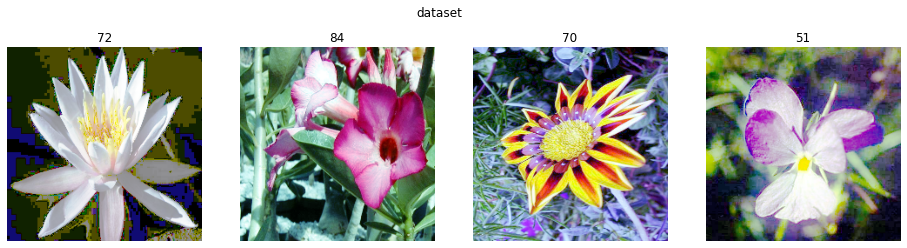

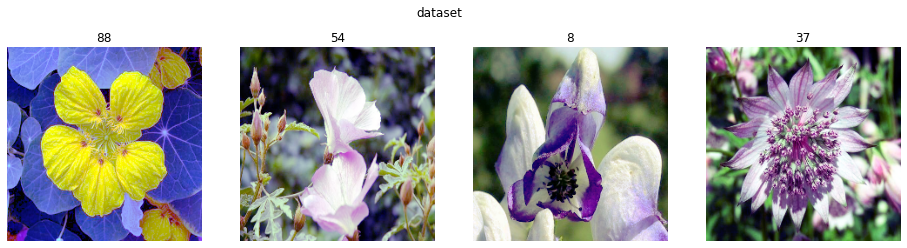

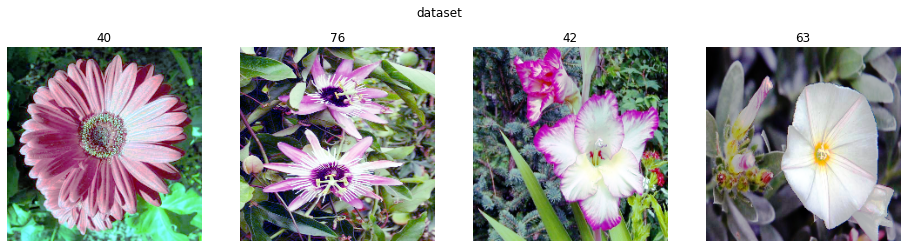

In [ ]:
datagen_args = dict(
    #rotation_range=8,
    #width_shift_range=0.1,
    #height_shift_range=0.1,
    #zoom_range=[.8, 1],
    #channel_shift_range=50,
    samplewise_center=True
    #shear_range=0.1
    #horizontal_flip=True
    )
datagen = ImageDataGenerator(**datagen_args)

def rand_transform(image):
  image = datagen.random_transform(image.numpy())
  return image

def datagenaug(image, label):
  result = tf.py_function(func=rand_transform, inp=[image], Tout=tf.uint8)

  return result, label

def rotation(image, label):
  angle = (tf.random.uniform((), minval=0, maxval=1) - 0.5)*90 # Maximum 45-degree clockwise or counter-clockwise rotation
  image = tfa.image.rotate(image, angle, fill_mode='nearest')
  return image, label

def flip(image, label):
  image = tf.image.flip_left_right(image)
  return image, label

def equalize(image, label):
  image = tfa.image.equalize(image)
  return image, label

def augfn(ds, funcs = [equalize]):
  return reduce(lambda y,x: y.map(x), funcs, ds)

#train_aug_ds = augfn(train_prep_ds)

#train_aug_ds = train_resized_ds
#train_aug_ds = augfn(train_resized_ds, [randaug, normalize_image])
#train_aug_subset = augfn(train_prep_ds.shuffle(100), [datagenaug])
#train_aug_ds = train_aug_subset #.concatenate(train_prep_ds)
train_aug_ds = augfn(train_prep_ds).cache()
val_aug_ds = augfn(val_prep_ds).cache()
test_aug_ds = augfn(test_prep_ds).cache()
#plot_dataset(train_aug_ds.shuffle(100))
plot_dataset(train_aug_ds)
plot_dataset(val_aug_ds)
plot_dataset(test_aug_ds)

# Training Setup

We define a training function and mechanisms to store experiment data like the history and the accuracy.

In [ ]:
def history_tmpl():
  snapshot_time = int(time())
  return 'history-{0}.hist'.format(snapshot_time)

def save_history(history):
  hist_name = history_tmpl()
  hist_path = path.join(HISTORY_DIR, hist_name)

  pickle.dump(history.history, open(hist_path, "wb"))
  return hist_path

In [ ]:
def train(experiment, model, tds, vds, batch_size=24, epochs=30):
  batch_tds = tds.shuffle(1000, reshuffle_each_iteration=True).batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
  batch_vds = vds.batch(256).prefetch(buffer_size=tf.data.AUTOTUNE)

  checkpoint = get_chkpt_callback()
  uploadfn = get_upload_callback(experiment)
  early_stopping = get_early_stopping_callback()
  history = model.fit(batch_tds, validation_data=batch_vds, epochs=epochs, callbacks=[uploadfn, checkpoint])

  return history

# Experiments

## baseline

In [ ]:
TRAINED_WEIGHTS = None
experiment = 'baseline'
batch_size = 24
epochs = 100

if TRAINED_WEIGHTS: print('Using trained weights: ', TRAINED_WEIGHTS)

model.load_weights(TRAINED_WEIGHTS or INITIAL_WEIGHTS)

baseline_hist = train(experiment, model, train_prep_ds, val_prep_ds, batch_size=batch_size, epochs=epochs)

baseline_hist_file = save_history(baseline_hist)
dbx_upload_history(experiment)

plot_acc(baseline_hist)
plot_loss(baseline_hist)

Epoch 1/100
43/43 [==============================] - 62s 1s/step - loss: 2.0118 - accuracy: 0.5627 - val_loss: 3.8848 - val_accuracy: 0.3922

Epoch 00001: val_accuracy improved from -inf to 0.39216, saving model to chkpt/weights-epoch-1-val_accuracy-0.3922.h5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/100
43/43 [==============================] - 62s 1s/step - loss: 0.0462 - accuracy: 0.9892 - val_loss: 3.2875 - val_accuracy: 0.4706

Epoch 00002: val_accuracy improved from 0.39216 to 0.47059, saving model to chkpt/weights-epoch-2-val_accuracy-0.4706.h5
Epoch 3/100
43/43 [==============================] - 63s 1s/step - loss: 0.0027 - accuracy: 0.9990 - val_loss: 2.8846 - val_accuracy: 0.5049

Epoch 00003: val_accuracy improved from 0.47059 to 0.50490, saving model to chkpt/weights-epoch-3-val_accuracy-0.5049.h5
Epoch 4/100
43/43 [==============================] - 63s 1s/step - loss: 6.5454e-04 - accuracy: 1.0000 - val_loss: 2.5161 - val_accuracy: 0.5412

Epoch 00004: val_accuracy improved from 0.50490 to 0.54118, saving model to chkpt/weights-epoch-4-val_accuracy-0.5412.h5
Epoch 5/100
43/43 [==============================] - 63s 1s/step - loss: 5.0392e-04 - accuracy: 1.0000 - val_loss: 2.2698 - val_accuracy: 0.5735

Epoch 00005: val_accuracy improved from 0.54118 to 0.57353, s

KeyboardInterrupt: ignored

In [ ]:
dbx_download_chkpt('baseline')

'chkpt/weights-epoch-42-val_accuracy-0.7775.h5'

In [ ]:
model.load_weights('chkpt/weights-epoch-42-val_accuracy-0.7775.h5')
batch_ds = test_prep_ds.batch(256)
model.evaluate(batch_ds)

25/25 [==============================] - 14s 572ms/step - loss: 1.1191 - accuracy: 0.7286


[1.1190762519836426, 0.728573739528656]

## basicaug-flip-rotate-0.3

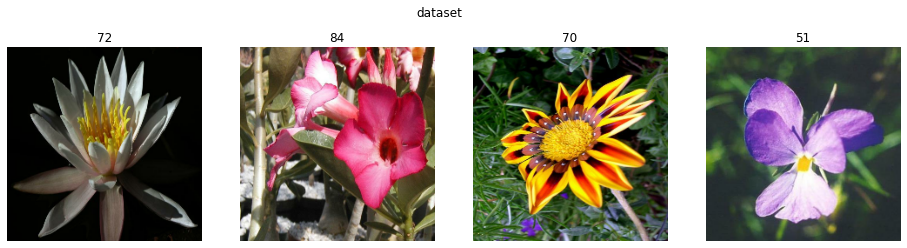

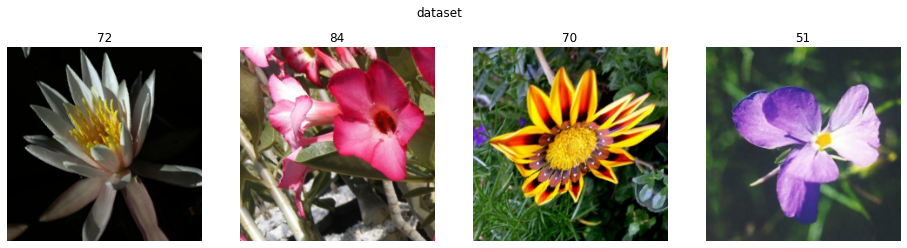

In [ ]:
basic_augs = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.3),
  #layers.RandomContrast(.7),
  #layers.RandomZoom(height_factor=(-.4, 0), fill_mode='nearest'),
  #layers.RandomCrop,
])

def basicaug(image, label):
  image = tf.expand_dims(image, 0) # Add the image to a batch
  image = basic_augs(image, training=True) # Apply augmentation
  image = tf.squeeze(image, axis=0) # Squeeze the batch
  return image, label

basicaug_fr_0_3_ds = mapchainfn(train_prep_ds, funcs=[basicaug], cache=False)

plot_dataset(train_prep_ds)
plot_dataset(basicaug_fr_0_3_ds)

Epoch 1/100
43/43 [==============================] - 12s 134ms/step - loss: 3.3640 - accuracy: 0.3735 - val_loss: 34.7591 - val_accuracy: 0.1402

Epoch 00001: val_accuracy improved from -inf to 0.14020, saving model to chkpt/weights-epoch-1-val_accuracy-0.1402.h5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/100
43/43 [==============================] - 12s 133ms/step - loss: 0.8029 - accuracy: 0.7814 - val_loss: 36.5145 - val_accuracy: 0.0931

Epoch 00002: val_accuracy did not improve from 0.14020
Epoch 3/100
43/43 [==============================] - 12s 132ms/step - loss: 0.5576 - accuracy: 0.8500 - val_loss: 20.5255 - val_accuracy: 0.2500

Epoch 00003: val_accuracy improved from 0.14020 to 0.25000, saving model to chkpt/weights-epoch-3-val_accuracy-0.2500.h5
Epoch 4/100
43/43 [==============================] - 12s 134ms/step - loss: 0.3571 - accuracy: 0.8971 - val_loss: 21.4397 - val_accuracy: 0.2441

Epoch 00004: val_accuracy did not improve from 0.25000
Epoch 5/100
43/43 [==============================] - 12s 131ms/step - loss: 0.2359 - accuracy: 0.9382 - val_loss: 18.0358 - val_accuracy: 0.2873

Epoch 00005: val_accuracy improved from 0.25000 to 0.28725, saving model to chkpt/weights-epoch-5-val_accuracy-0.2873.h5
Epoch 6/100
43/43 [==============================] - 12s 132ms/s

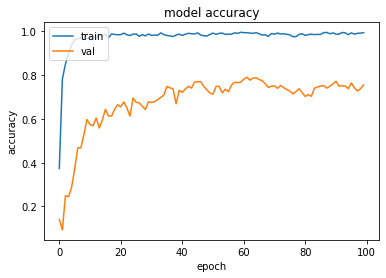

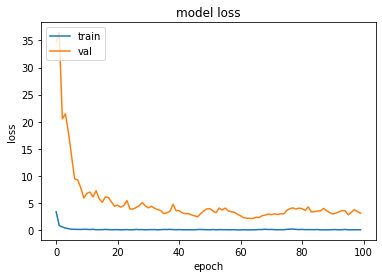

In [ ]:
TRAINED_WEIGHTS = None
experiment = 'basicaug-flip-rotate-0.3'
batch_size = 24
epochs = 100

if TRAINED_WEIGHTS: print('Using trained weights: ', TRAINED_WEIGHTS)
model.load_weights(TRAINED_WEIGHTS or INITIAL_WEIGHTS)

basicaug_fr_0_3_hist = train(experiment, model, basicaug_fr_0_3_ds, val_prep_ds, batch_size=batch_size, epochs=epochs)

basicaug_fr_0_3_hist_file = save_history(basicaug_fr_0_3_hist)
dbx_upload_history(experiment)

plot_acc(basicaug_fr_0_3_hist)
plot_loss(basicaug_fr_0_3_hist)

## basicaug-hflip-rotate-0.1

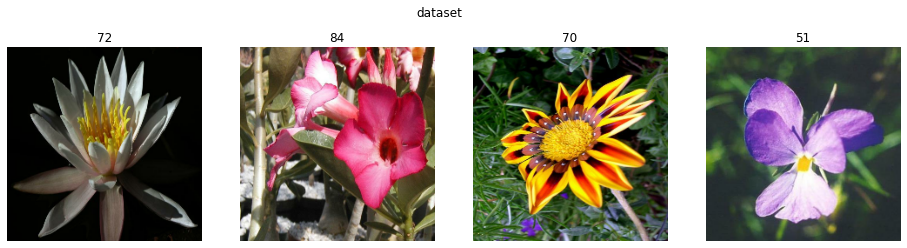

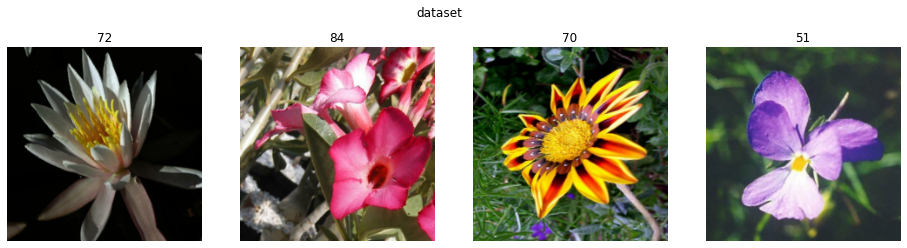

In [ ]:
basic_augs = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal"),
  layers.experimental.preprocessing.RandomRotation(0.1),
  #layers.RandomContrast(.7),
  #layers.RandomZoom(height_factor=(-.4, 0), width_factor=(-.4, 0), fill_mode='nearest'),
  #layers.RandomCrop,
])

def basicaug(image, label):
  image = tf.expand_dims(image, 0) # Add the image to a batch
  image = basic_augs(image, training=True) # Apply augmentation
  image = tf.squeeze(image, axis=0) # Squeeze the batch
  return image, label

basicaug_hfr_0_1_ds = mapchainfn(train_prep_ds, funcs=[basicaug], cache=False)

plot_dataset(train_prep_ds)
plot_dataset(basicaug_hfr_0_1_ds)

Epoch 1/100
43/43 [==============================] - 11s 135ms/step - loss: 3.1510 - accuracy: 0.4539 - val_loss: 66.2706 - val_accuracy: 0.0755

Epoch 00001: val_accuracy improved from -inf to 0.07549, saving model to chkpt/weights-epoch-1-val_accuracy-0.0755.h5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/100
43/43 [==============================] - 11s 134ms/step - loss: 0.7298 - accuracy: 0.8382 - val_loss: 42.9305 - val_accuracy: 0.1167

Epoch 00002: val_accuracy improved from 0.07549 to 0.11667, saving model to chkpt/weights-epoch-2-val_accuracy-0.1167.h5
Epoch 3/100
43/43 [==============================] - 11s 131ms/step - loss: 0.4137 - accuracy: 0.9167 - val_loss: 23.9742 - val_accuracy: 0.2765

Epoch 00003: val_accuracy improved from 0.11667 to 0.27647, saving model to chkpt/weights-epoch-3-val_accuracy-0.2765.h5
Epoch 4/100
43/43 [==============================] - 11s 131ms/step - loss: 0.3034 - accuracy: 0.9324 - val_loss: 18.2911 - val_accuracy: 0.3520

Epoch 00004: val_accuracy improved from 0.27647 to 0.35196, saving model to chkpt/weights-epoch-4-val_accuracy-0.3520.h5
Epoch 5/100
43/43 [==============================] - 11s 132ms/step - loss: 0.2721 - accuracy: 0.9480 - val_loss: 25.1683 - val_accuracy: 0.2853

Epoch 00005: val_accuracy did not improve from 0.3519

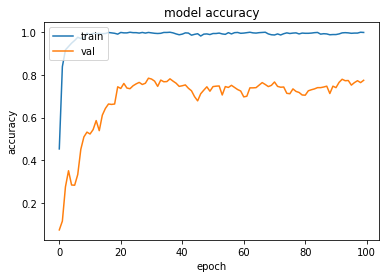

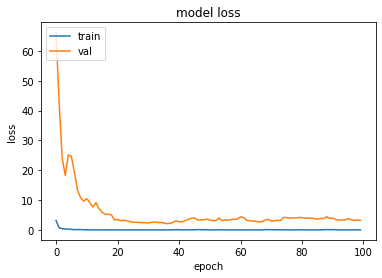

In [ ]:
TRAINED_WEIGHTS = None
experiment = 'basicaug-hflip-rotate-0.1'
batch_size = 24
epochs = 100

if TRAINED_WEIGHTS: print('Using trained weights: ', TRAINED_WEIGHTS)
model.load_weights(TRAINED_WEIGHTS or INITIAL_WEIGHTS)

basicaug_hfr_0_1_hist = train(experiment, model, basicaug_hfr_0_1_ds, val_prep_ds, batch_size=batch_size, epochs=epochs)

basicaug_hfr_0_1_hist_file = save_history(basicaug_hfr_0_1_hist)
dbx_upload_history(experiment)

plot_acc(basicaug_hfr_0_1_hist)
plot_loss(basicaug_hfr_0_1_hist)

## basicaug-vflip

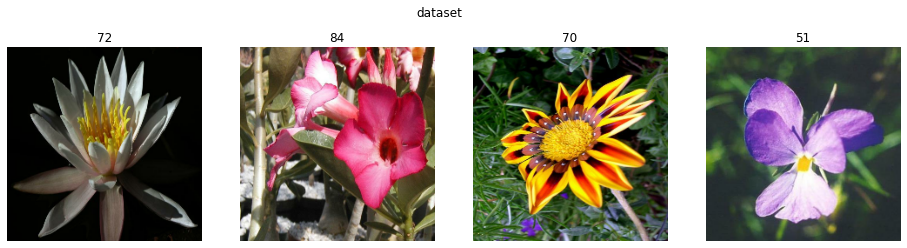

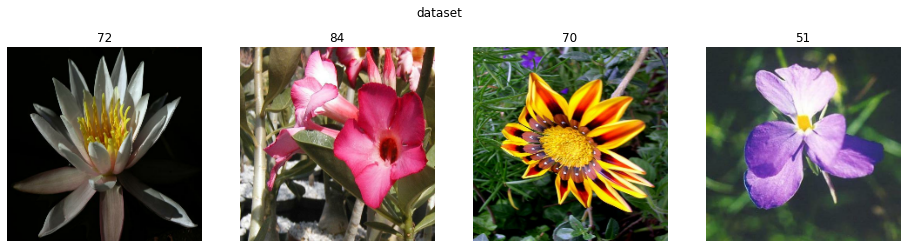

In [ ]:
basic_augs = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("vertical"),
  #layers.experimental.preprocessing.RandomRotation(0.1),
  #layers.RandomContrast(.7),
  #layers.RandomZoom(height_factor=(-.4, 0), width_factor=(-.4, 0), fill_mode='nearest'),
  #layers.RandomCrop,
])

def basicaug(image, label):
  image = tf.expand_dims(image, 0) # Add the image to a batch
  image = basic_augs(image, training=True) # Apply augmentation
  image = tf.squeeze(image, axis=0) # Squeeze the batch
  return image, label

basicaug_vflip_ds = mapchainfn(train_prep_ds, funcs=[basicaug], cache=False)

plot_dataset(train_prep_ds)
plot_dataset(basicaug_vflip_ds)

Epoch 1/100
43/43 [==============================] - 7s 134ms/step - loss: 3.0712 - accuracy: 0.4392 - val_loss: 82.9096 - val_accuracy: 0.0373

Epoch 00001: val_accuracy improved from -inf to 0.03725, saving model to chkpt/weights-epoch-1-val_accuracy-0.0373.h5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/100
43/43 [==============================] - 6s 132ms/step - loss: 0.7931 - accuracy: 0.8559 - val_loss: 48.5900 - val_accuracy: 0.1245

Epoch 00002: val_accuracy improved from 0.03725 to 0.12451, saving model to chkpt/weights-epoch-2-val_accuracy-0.1245.h5
Epoch 3/100
43/43 [==============================] - 6s 132ms/step - loss: 0.5610 - accuracy: 0.9078 - val_loss: 49.7577 - val_accuracy: 0.1294

Epoch 00003: val_accuracy improved from 0.12451 to 0.12941, saving model to chkpt/weights-epoch-3-val_accuracy-0.1294.h5
Epoch 4/100
43/43 [==============================] - 7s 133ms/step - loss: 0.3039 - accuracy: 0.9461 - val_loss: 40.6824 - val_accuracy: 0.1490

Epoch 00004: val_accuracy improved from 0.12941 to 0.14902, saving model to chkpt/weights-epoch-4-val_accuracy-0.1490.h5
Epoch 5/100
43/43 [==============================] - 6s 131ms/step - loss: 0.1558 - accuracy: 0.9706 - val_loss: 36.0472 - val_accuracy: 0.2108

Epoch 00005: val_accuracy improved from 0.14902 to 0.2107

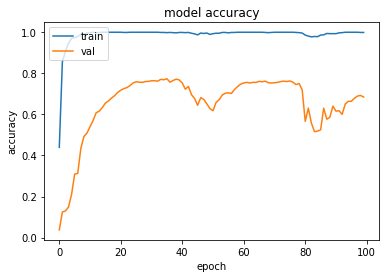

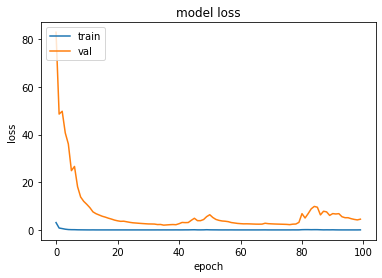

In [ ]:
TRAINED_WEIGHTS = None
experiment = 'basicaug-vflip'
batch_size = 24
epochs = 100

if TRAINED_WEIGHTS: print('Using trained weights: ', TRAINED_WEIGHTS)
model.load_weights(TRAINED_WEIGHTS or INITIAL_WEIGHTS)

basicaug_vflip_hist = train(experiment, model, basicaug_vflip_ds, val_prep_ds, batch_size=batch_size, epochs=epochs)

basicaug_vflip_hist_file = save_history(basicaug_vflip_hist)
dbx_upload_history(experiment)

plot_acc(basicaug_vflip_hist)
plot_loss(basicaug_vflip_hist)

## basicaug-zoom--.4-1

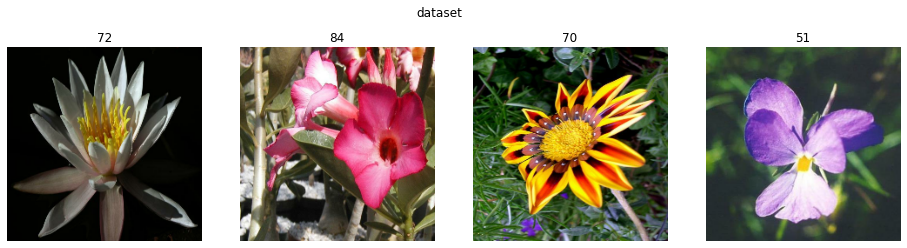

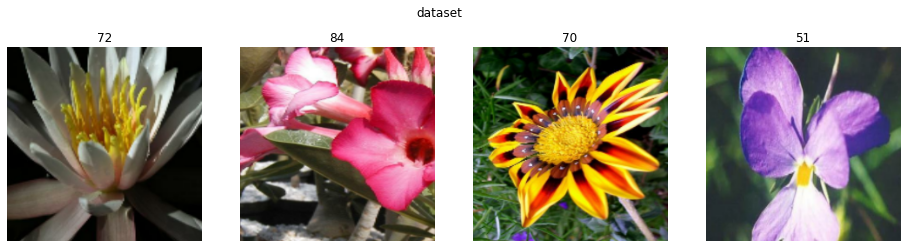

In [ ]:
basic_augs = tf.keras.Sequential([
  layers.RandomZoom(height_factor=(-.4, 0), width_factor=(-.4, 0), fill_mode='nearest'),
  #layers.RandomCrop,
])

def basicaug(image, label):
  image = tf.expand_dims(image, 0) # Add the image to a batch
  image = basic_augs(image, training=True) # Apply augmentation
  image = tf.squeeze(image, axis=0) # Squeeze the batch
  return image, label

basicaug_zoom_mp4_1_ds = mapchainfn(train_prep_ds, funcs=[basicaug], cache=False)

plot_dataset(train_prep_ds)
plot_dataset(basicaug_zoom_mp4_1_ds)

Epoch 1/100
43/43 [==============================] - 19s 173ms/step - loss: 3.9825 - accuracy: 0.3069 - val_loss: 4.6816 - val_accuracy: 0.4765

Epoch 00001: val_accuracy improved from -inf to 0.47647, saving model to chkpt/weights-epoch-1-val_accuracy-0.4765.h5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/100
43/43 [==============================] - 10s 134ms/step - loss: 0.1243 - accuracy: 0.9676 - val_loss: 6.9574 - val_accuracy: 0.3902

Epoch 00002: val_accuracy did not improve from 0.47647
Epoch 3/100
43/43 [==============================] - 10s 130ms/step - loss: 0.0388 - accuracy: 0.9922 - val_loss: 5.2512 - val_accuracy: 0.4775

Epoch 00003: val_accuracy improved from 0.47647 to 0.47745, saving model to chkpt/weights-epoch-3-val_accuracy-0.4775.h5
Epoch 4/100
43/43 [==============================] - 10s 131ms/step - loss: 0.0208 - accuracy: 0.9961 - val_loss: 4.2347 - val_accuracy: 0.5167

Epoch 00004: val_accuracy improved from 0.47745 to 0.51667, saving model to chkpt/weights-epoch-4-val_accuracy-0.5167.h5
Epoch 5/100
43/43 [==============================] - 10s 133ms/step - loss: 0.0102 - accuracy: 0.9971 - val_loss: 4.0335 - val_accuracy: 0.5255

Epoch 00005: val_accuracy improved from 0.51667 to 0.52549, saving model to chkpt/weights-epoch-5-val_accuracy-0.5255.h5
Ep

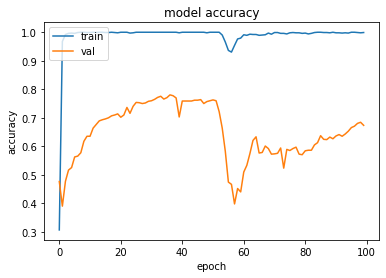

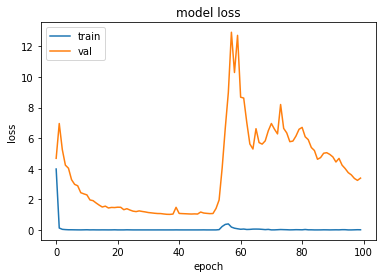

In [ ]:
TRAINED_WEIGHTS = None
experiment = 'basicaug-zoom--.4-1'
batch_size = 24
epochs = 100

if TRAINED_WEIGHTS: print('Using trained weights: ', TRAINED_WEIGHTS)
model.load_weights(TRAINED_WEIGHTS or INITIAL_WEIGHTS)

basicaug_zoom_mp4_1_hist = train(experiment, model, basicaug_zoom_mp4_1_ds, val_prep_ds, batch_size=batch_size, epochs=epochs)

basicaug_zoom_mp4_1_hist_file = save_history(basicaug_zoom_mp4_1_hist)
dbx_upload_history(experiment)

plot_acc(basicaug_zoom_mp4_1_hist)
plot_loss(basicaug_zoom_mp4_1_hist)

In [ ]:
model.load_weights('chkpt/weights-epoch-37-val_accuracy-0.7804.h5')

In [ ]:
batch_ds = test_prep_ds.batch(256)
model.evaluate(batch_ds)

25/25 [==============================] - 29s 1s/step - loss: 1.2573 - accuracy: 0.7297


[1.25733482837677, 0.7297121286392212]

## basicaug-trans-.1-.2

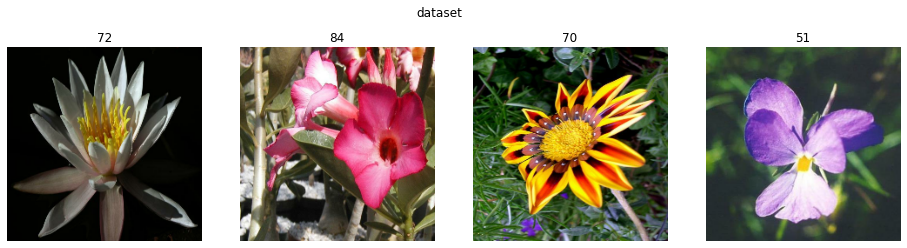

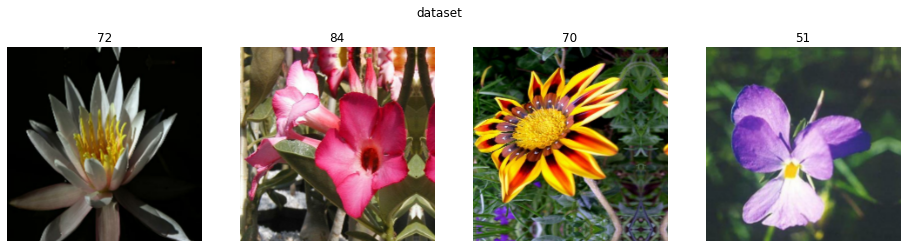

In [ ]:
basic_augs = tf.keras.Sequential([
  #layers.RandomZoom(height_factor=(-.4, 0), width_factor=(-.4, 0), fill_mode='nearest'),
  layers.RandomTranslation(.1, .2)
])

def basicaug(image, label):
  image = tf.expand_dims(image, 0) # Add the image to a batch
  image = basic_augs(image, training=True) # Apply augmentation
  image = tf.squeeze(image, axis=0) # Squeeze the batch
  return image, label

basicaug_trans_p1_p2_ds = mapchainfn(train_prep_ds, funcs=[basicaug], cache=False)

plot_dataset(train_prep_ds)
plot_dataset(basicaug_trans_p1_p2_ds)

Epoch 1/100
43/43 [==============================] - 13s 191ms/step - loss: 3.1258 - accuracy: 0.4235 - val_loss: 82.8924 - val_accuracy: 0.0480

Epoch 00001: val_accuracy improved from -inf to 0.04804, saving model to chkpt/weights-epoch-1-val_accuracy-0.0480.h5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/100
43/43 [==============================] - 11s 129ms/step - loss: 0.8927 - accuracy: 0.8451 - val_loss: 33.2175 - val_accuracy: 0.2020

Epoch 00002: val_accuracy improved from 0.04804 to 0.20196, saving model to chkpt/weights-epoch-2-val_accuracy-0.2020.h5
Epoch 3/100
43/43 [==============================] - 10s 127ms/step - loss: 0.6199 - accuracy: 0.8892 - val_loss: 40.6368 - val_accuracy: 0.1833

Epoch 00003: val_accuracy did not improve from 0.20196
Epoch 4/100
43/43 [==============================] - 10s 127ms/step - loss: 0.5105 - accuracy: 0.9157 - val_loss: 58.3128 - val_accuracy: 0.1020

Epoch 00004: val_accuracy did not improve from 0.20196
Epoch 5/100
43/43 [==============================] - 11s 129ms/step - loss: 0.2585 - accuracy: 0.9510 - val_loss: 39.7095 - val_accuracy: 0.2020

Epoch 00005: val_accuracy did not improve from 0.20196
Epoch 6/100
43/43 [==============================] - 10s 127ms/step - loss: 0.2099 - accuracy: 0.9637 - val_loss: 32.5403 - val_ac

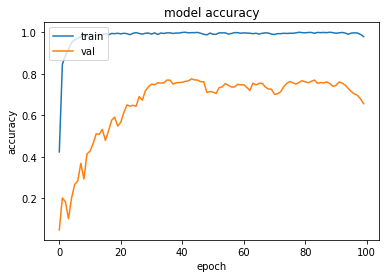

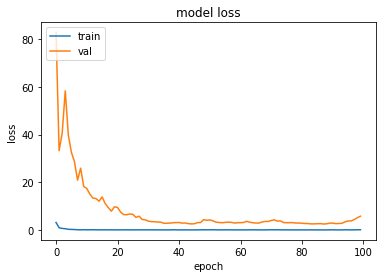

In [ ]:
TRAINED_WEIGHTS = None
experiment = 'basicaug-trans-.1-.2'
batch_size = 24
epochs = 100

if TRAINED_WEIGHTS: print('Using trained weights: ', TRAINED_WEIGHTS)
model.load_weights(TRAINED_WEIGHTS or INITIAL_WEIGHTS)

basicaug_trans_p1_p2_hist = train(experiment, model, basicaug_trans_p1_p2_ds, val_prep_ds, batch_size=batch_size, epochs=epochs)

basicaug_trans_p1_p2_hist_file = save_history(basicaug_trans_p1_p2_hist)
dbx_upload_history(experiment)

plot_acc(basicaug_trans_p1_p2_hist)
plot_loss(basicaug_trans_p1_p2_hist)

## basicaug-trans-.1-.1-zoom--.2-0

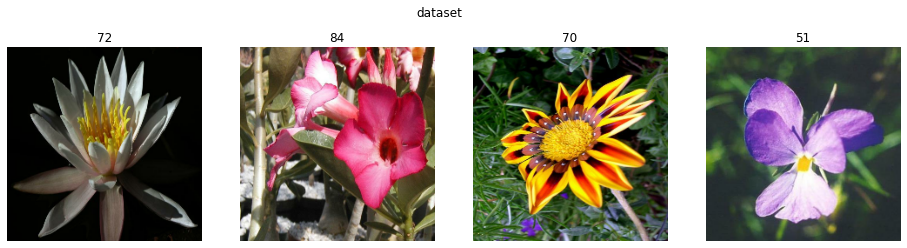

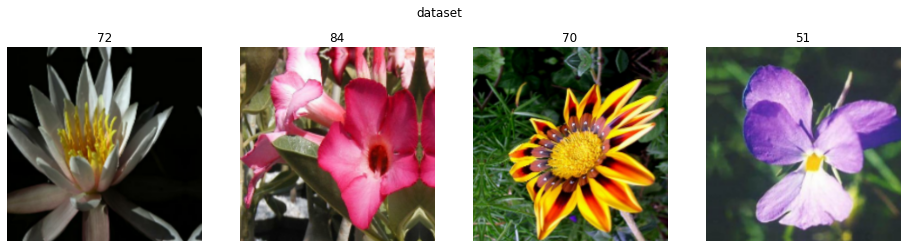

In [ ]:
basic_augs = tf.keras.Sequential([
  layers.RandomZoom(height_factor=(-.2, 0), width_factor=(-.2, 0), fill_mode='nearest'),
  layers.RandomTranslation(.1, .1)
])

def basicaug(image, label):
  image = tf.expand_dims(image, 0) # Add the image to a batch
  image = basic_augs(image, training=True) # Apply augmentation
  image = tf.squeeze(image, axis=0) # Squeeze the batch
  return image, label

basicaug_trans_p1_p1_zoom_mp2_0_ds = mapchainfn(train_prep_ds, funcs=[basicaug], cache=False)

plot_dataset(train_prep_ds)
plot_dataset(basicaug_trans_p1_p1_zoom_mp2_0_ds)

Epoch 1/100
43/43 [==============================] - 15s 129ms/step - loss: 3.1027 - accuracy: 0.4353 - val_loss: 78.2663 - val_accuracy: 0.0520

Epoch 00001: val_accuracy improved from -inf to 0.05196, saving model to chkpt/weights-epoch-1-val_accuracy-0.0520.h5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/100
43/43 [==============================] - 15s 127ms/step - loss: 0.6449 - accuracy: 0.8902 - val_loss: 40.6386 - val_accuracy: 0.1471

Epoch 00002: val_accuracy improved from 0.05196 to 0.14706, saving model to chkpt/weights-epoch-2-val_accuracy-0.1471.h5
Epoch 3/100
43/43 [==============================] - 15s 129ms/step - loss: 0.2594 - accuracy: 0.9520 - val_loss: 16.4037 - val_accuracy: 0.4147

Epoch 00003: val_accuracy improved from 0.14706 to 0.41471, saving model to chkpt/weights-epoch-3-val_accuracy-0.4147.h5
Epoch 4/100
43/43 [==============================] - 15s 128ms/step - loss: 0.2576 - accuracy: 0.9559 - val_loss: 14.7507 - val_accuracy: 0.4392

Epoch 00004: val_accuracy improved from 0.41471 to 0.43922, saving model to chkpt/weights-epoch-4-val_accuracy-0.4392.h5
Epoch 5/100
43/43 [==============================] - 15s 127ms/step - loss: 0.1640 - accuracy: 0.9637 - val_loss: 11.1537 - val_accuracy: 0.4951

Epoch 00005: val_accuracy improved from 0.43922 to 0.

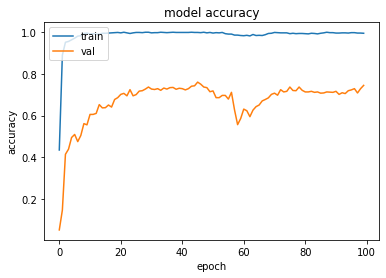

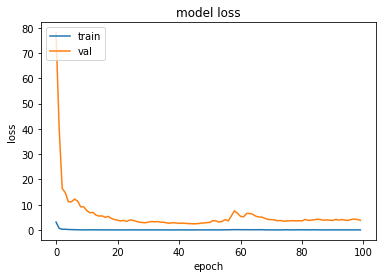

In [ ]:
TRAINED_WEIGHTS = None
experiment = 'basicaug-trans-.1-.1-zoom--.2-0'
batch_size = 24
epochs = 100

if TRAINED_WEIGHTS: print('Using trained weights: ', TRAINED_WEIGHTS)
model.load_weights(TRAINED_WEIGHTS or INITIAL_WEIGHTS)

basicaug_trans_p1_p1_zoom_mp2_0_hist = train(experiment, model, basicaug_trans_p1_p1_zoom_mp2_0_ds, val_prep_ds, batch_size=batch_size, epochs=epochs)

basicaug_trans_p1_p1_zoom_mp2_0_hist_file = save_history(basicaug_trans_p1_p1_zoom_mp2_0_hist)
dbx_upload_history(experiment)

plot_acc(basicaug_trans_p1_p1_zoom_mp2_0_hist)
plot_loss(basicaug_trans_p1_p1_zoom_mp2_0_hist)

## randaug-layers-1-mag-3

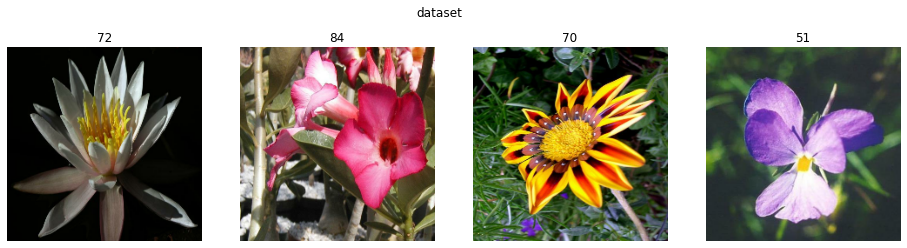

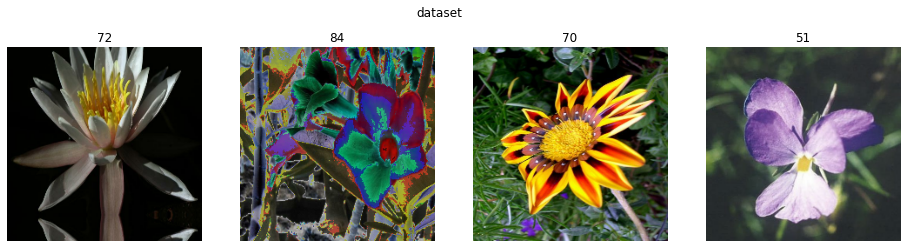

In [ ]:
randaug = RandAugment(num_layers=1, magnitude=3)

def randaugfn(image, label):
  return randaug.distort(image), label

randaug_l_1_m_3_ds = mapchainfn(train_prep_ds, funcs=[randaugfn], cache=False)

plot_dataset(train_prep_ds)
plot_dataset(randaug_l_1_m_3_ds)

Epoch 1/100
43/43 [==============================] - 10s 135ms/step - loss: 3.7270 - accuracy: 0.3608 - val_loss: 113.2167 - val_accuracy: 0.0206

Epoch 00001: val_accuracy improved from -inf to 0.02059, saving model to chkpt/weights-epoch-1-val_accuracy-0.0206.h5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/100
43/43 [==============================] - 11s 133ms/step - loss: 0.9744 - accuracy: 0.8039 - val_loss: 68.1213 - val_accuracy: 0.0539

Epoch 00002: val_accuracy improved from 0.02059 to 0.05392, saving model to chkpt/weights-epoch-2-val_accuracy-0.0539.h5
Epoch 3/100
43/43 [==============================] - 10s 133ms/step - loss: 0.6777 - accuracy: 0.8676 - val_loss: 44.1251 - val_accuracy: 0.1471

Epoch 00003: val_accuracy improved from 0.05392 to 0.14706, saving model to chkpt/weights-epoch-3-val_accuracy-0.1471.h5
Epoch 4/100
43/43 [==============================] - 10s 134ms/step - loss: 0.5216 - accuracy: 0.8990 - val_loss: 33.2490 - val_accuracy: 0.2216

Epoch 00004: val_accuracy improved from 0.14706 to 0.22157, saving model to chkpt/weights-epoch-4-val_accuracy-0.2216.h5
Epoch 5/100
43/43 [==============================] - 10s 132ms/step - loss: 0.4618 - accuracy: 0.9157 - val_loss: 23.8852 - val_accuracy: 0.3314

Epoch 00005: val_accuracy improved from 0.22157 to 0.

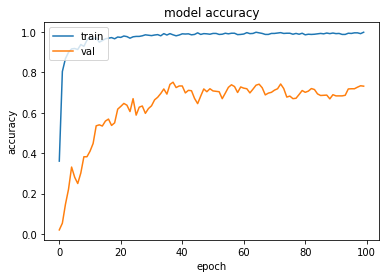

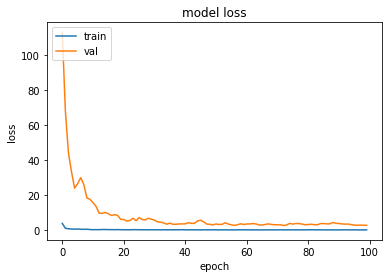

In [ ]:
TRAINED_WEIGHTS = None
experiment = 'randaug-layers-1-mag-3'
batch_size = 24
epochs = 100

if TRAINED_WEIGHTS: print('Using trained weights: ', TRAINED_WEIGHTS)
model.load_weights(TRAINED_WEIGHTS or INITIAL_WEIGHTS)

randaug_l_1_m_3_hist = train(experiment, model, randaug_l_1_m_3_ds, val_prep_ds, batch_size=batch_size, epochs=epochs)

randaug_l_1_m_3_hist_file = save_history(randaug_l_1_m_3_hist)
dbx_upload_history(experiment)

plot_acc(randaug_l_1_m_3_hist)
plot_loss(randaug_l_1_m_3_hist)

## autoaug

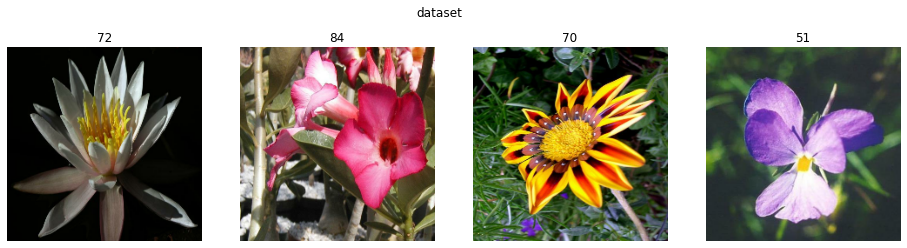

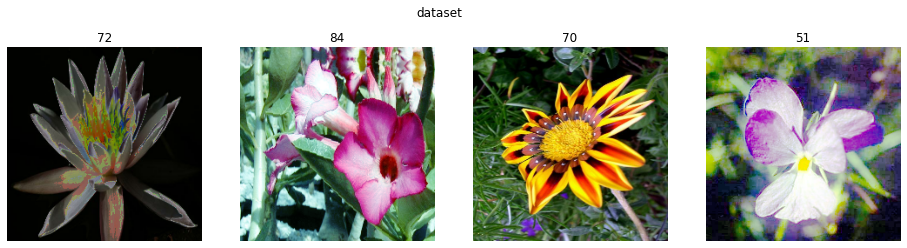

In [ ]:
from official.vision.beta.ops.augment import AutoAugment

autoaug = AutoAugment()

def autoaugfn(image, label):
  return autoaug.distort(image), label

autoaug_ds = mapchainfn(train_prep_ds, funcs=[autoaugfn], cache=False)

plot_dataset(train_prep_ds)
plot_dataset(autoaug_ds)

Epoch 1/100
43/43 [==============================] - 56s 312ms/step - loss: 4.6362 - accuracy: 0.2167 - val_loss: 8.1452 - val_accuracy: 0.2882

Epoch 00001: val_accuracy improved from -inf to 0.28824, saving model to chkpt/weights-epoch-1-val_accuracy-0.2882.h5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/100
43/43 [==============================] - 14s 130ms/step - loss: 0.8436 - accuracy: 0.7833 - val_loss: 10.2784 - val_accuracy: 0.3225

Epoch 00002: val_accuracy improved from 0.28824 to 0.32255, saving model to chkpt/weights-epoch-2-val_accuracy-0.3225.h5
Epoch 3/100
43/43 [==============================] - 14s 130ms/step - loss: 0.5311 - accuracy: 0.8745 - val_loss: 10.0165 - val_accuracy: 0.3471

Epoch 00003: val_accuracy improved from 0.32255 to 0.34706, saving model to chkpt/weights-epoch-3-val_accuracy-0.3471.h5
Epoch 4/100
43/43 [==============================] - 14s 128ms/step - loss: 0.5110 - accuracy: 0.8843 - val_loss: 9.1246 - val_accuracy: 0.4196

Epoch 00004: val_accuracy improved from 0.34706 to 0.41961, saving model to chkpt/weights-epoch-4-val_accuracy-0.4196.h5
Epoch 5/100
43/43 [==============================] - 13s 128ms/step - loss: 0.3997 - accuracy: 0.9049 - val_loss: 9.9102 - val_accuracy: 0.3990

Epoch 00005: val_accuracy did not improve from 0.41961


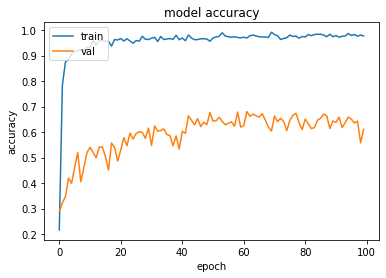

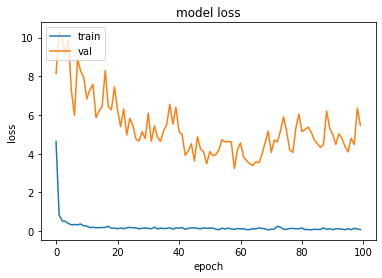

In [ ]:
TRAINED_WEIGHTS = None
experiment = 'autoaug'
batch_size = 24
epochs = 100

if TRAINED_WEIGHTS: print('Using trained weights: ', TRAINED_WEIGHTS)
model.load_weights(TRAINED_WEIGHTS or INITIAL_WEIGHTS)

autoaug_ds_hist = train(experiment, model, autoaug_ds, val_prep_ds, batch_size=batch_size, epochs=epochs)

autoaug_ds_hist_file = save_history(autoaug_ds_hist)
dbx_upload_history(experiment)

plot_acc(autoaug_ds_hist)
plot_loss(autoaug_ds_hist)

## mixaug

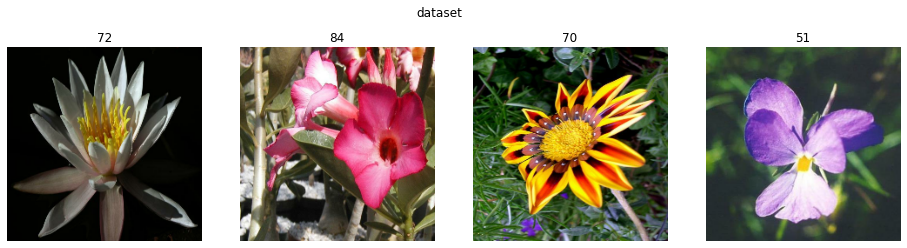

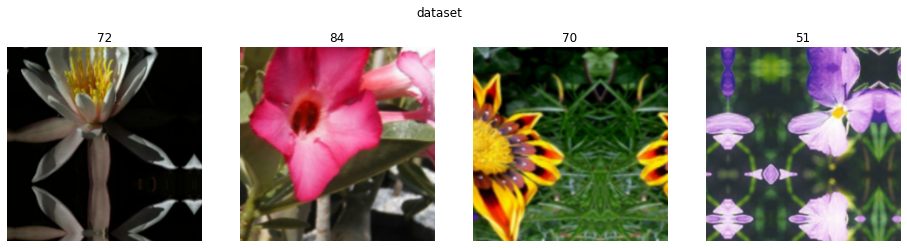

In [ ]:
mixaug = tf.keras.Sequential([
  layers.RandomRotation(0.11),
  layers.RandomTranslation(.4, .4),
  layers.RandomZoom(.3),
  layers.RandomFlip("horizontal"),
])

def mixaugfn(image, label):
  image = tf.expand_dims(image, 0) # Add the image to a batch
  image = mixaug(image, training=True) # Apply augmentation
  image = tf.squeeze(image, axis=0) # Squeeze the batch
  return image, label

mixaugfn_ds = mapchainfn(train_prep_ds, funcs=[mixaugfn], cache=False)

plot_dataset(train_prep_ds)
plot_dataset(mixaugfn_ds)

Epoch 1/100
43/43 [==============================] - 21s 130ms/step - loss: 4.7600 - accuracy: 0.1863 - val_loss: 29.0105 - val_accuracy: 0.1000

Epoch 00001: val_accuracy improved from -inf to 0.10000, saving model to chkpt/weights-epoch-1-val_accuracy-0.1000.h5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/100
43/43 [==============================] - 21s 130ms/step - loss: 2.0994 - accuracy: 0.5088 - val_loss: 26.1037 - val_accuracy: 0.1902

Epoch 00002: val_accuracy improved from 0.10000 to 0.19020, saving model to chkpt/weights-epoch-2-val_accuracy-0.1902.h5
Epoch 3/100
43/43 [==============================] - 21s 130ms/step - loss: 1.4833 - accuracy: 0.6471 - val_loss: 23.6724 - val_accuracy: 0.1873

Epoch 00003: val_accuracy did not improve from 0.19020
Epoch 4/100
43/43 [==============================] - 21s 128ms/step - loss: 1.2044 - accuracy: 0.6814 - val_loss: 26.3748 - val_accuracy: 0.1735

Epoch 00004: val_accuracy did not improve from 0.19020
Epoch 5/100
43/43 [==============================] - 21s 130ms/step - loss: 1.0735 - accuracy: 0.7216 - val_loss: 22.4276 - val_accuracy: 0.2275

Epoch 00005: val_accuracy improved from 0.19020 to 0.22745, saving model to chkpt/weights-epoch-5-val_accuracy-0.2275.h5
Epoch 6/100
43/43 [==============================] - 21s 130ms/s

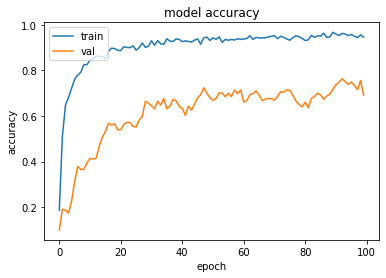

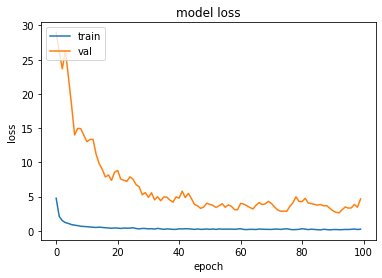

In [ ]:
TRAINED_WEIGHTS = None
experiment = 'mixaug'
batch_size = 24
epochs = 100

if TRAINED_WEIGHTS: print('Using trained weights: ', TRAINED_WEIGHTS)
model.load_weights(TRAINED_WEIGHTS or INITIAL_WEIGHTS)

mixaugfn_hist = train(experiment, model, mixaugfn_ds, val_prep_ds, batch_size=batch_size, epochs=epochs)

mixaugfn_hist_file = save_history(mixaugfn_hist)
dbx_upload_history(experiment)

plot_acc(mixaugfn_hist)
plot_loss(mixaugfn_hist)

# Predictions

In [ ]:
def ds_predictions(ds):
  batch_ds = ds.batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)
  predictions = model.predict(batch_ds) # Compute soft labels
  predicted_labels = np.argmax(predictions, axis=1) # Compute hard labels

  return predicted_labels

def ds_labels(ds):
  return list(ds.map(labelfn).as_numpy_iterator())

def prediction_results(ds):
  return ds_labels(ds), ds_predictions(ds)

def prediction_comparisons(ds1, ds2):
  return prediction_results(ds1), prediction_results(ds2)

In [ ]:
train_metrics_ds = train_prep_ds
test_metrics_ds = test_prep_ds
train_results, test_results = prediction_comparisons(train_metrics_ds, test_metrics_ds)

# Analysis

We provide functions to plot confusion matrix.

Plot:
* Confusion Matrix

## Functions

* classification_report(results)
* confusion_matrix(results)
* class_accuracies(cm) (cm is the confusion matrix)
* class_samples(cm) (cm is the confusion matrix)
* min_classification(cm) (cm is the confusion matrix). This functions returns the classes that have does not have highest predictions for the correct class.

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from functools import reduce

INCHS_PER_CLASS= 0.3 # Confusion matrix display size per class
MIN_CM_FIG_SIZE = 5 # Minimum confusion matrix display figure size

def cm_size():
  calc_size = int(NUM_CLASSES*INCHS_PER_CLASS) # Calculated size
  size = max(MIN_CM_FIG_SIZE, calc_size)

  return (size, size)

def plot_cm(cm, title='Confusion Matrix'):
  # Create a plot to display the confusion matrix
  fig, ax = plt.subplots(1, 1, figsize=cm_size())

  cmd = ConfusionMatrixDisplay(confusion_matrix=cm)
  cmd.plot(ax=ax)

  fig.suptitle(title)
  plt.show()

def merge_mincs(container, vs):
  container.update({vs[0], vs[1]})
  return container

def mincs_labels(results):
  return reduce(merge_mincs, results, set())

def plot_mincs(results, title='Minimum Clasisfications'):
  pass

def class_accuracies(cm):
  return cm / np.sum(cm, axis=1)[:, None]

def class_samples(cm):
  return np.sum(cm, axis=1)

def min_classifications(cm):
  pca = class_accuracies(cm) # Per-class accuracies
  pcs = class_samples(cm) # Per-class samples
  max_class = np.argmax(pca, axis=1) # Class with maximum matches for a given true class.
  max_acc = np.max(pca, axis=1) # Majority class predictions for a given true class.

  items = zip(range(NUM_CLASSES), max_class, max_acc, pcs)
  min_classification = filter(lambda item: item[0] != item[1], items)

  return min_classification

def misclassifications(cm):
  mask = np.fromfunction(lambda row, col: row != col, cm.shape, dtype=int)

  return np.multiply(cm, mask)

def worst_misclassifications(cm, k=5):
  misses = misclassifications(cm) # Eliminates matches from the confusion matrix.

  # The index in a sorted array which partitions the top K worst elements from the rest.
  worst_partition_start_idx = np.size(misses) - k

  # Top-K worst classifications indices
  flat_ids = np.argpartition(misses.ravel(), worst_partition_start_idx)[-k:]

  # Reconstructs rows and columns from the flattened indices
  row_ids, col_ids = np.unravel_index(flat_ids, misses.shape)

  return list(zip(row_ids, col_ids))

def topk(values, k=5):
  indices = np.argpartition(values, -k)[-k:]
  filtered = np.partition(values, -k)[-k:]
  paired = zip(indices, filtered)

  return list(paired)

In [ ]:
def unpack_sample_resultfn(sample, result):
  (image, true_label) = sample
  (_, predicted_label) = result

  return image, true_label, predicted_label

# Combines samples with prediction results
def sample_results_ds(ds, results):
  results_ds = tf.data.Dataset.from_tensor_slices(results)
  results_samples_ds = tf.data.Dataset.zip((ds, results_ds)).map(unpack_sample_resultfn)

  return results_samples_ds

def create_results_filterfn(selection):
  return lambda image, tl, pl: tf.reduce_any(tf.reduce_all(tf.equal((tl, pl), selection), 1))

def mismatchfn(image, tl, pl):
  return tl != pl

## Metrics

It computes the following:
* true_labels
* predicted_labels
* cm (Confusion Matrix)
* mincs (Minority Classifications, The classes which have another class with highest predictions)
* report (A classification report which shows the usual metrics)

In [ ]:
train_results

In [ ]:
train_report = classification_report(*train_results) # Training Classification Report
test_report = classification_report(*test_results) # Test Classification Report

In [ ]:
train_cm = confusion_matrix(*train_results, labels=list(range(NUM_CLASSES))) # Training Confusion Matrix
test_cm = confusion_matrix(*test_results, labels=list(range(NUM_CLASSES))) # Test Confusion Matrix

In [ ]:
train_mincs = list(min_classifications(train_cm)) # Training Minority Classifications
test_mincs = list(min_classifications(test_cm)) # Test Minority Classifications

In [ ]:
train_mincs_labels = mincs_labels(train_mincs)
test_mincs_labels = mincs_labels(test_mincs)

In [ ]:
train_misses_cm = misclassifications(train_cm)
test_misses_cm = misclassifications(test_cm)

In [ ]:
train_class_misses = class_samples(train_misses_cm)
test_class_misses = class_samples(test_misses_cm)

In [ ]:
worst_train_misses = worst_misclassifications(train_cm)
worst_test_misses = worst_misclassifications(test_cm)

In [ ]:
train_sample_results = sample_results_ds(train_metrics_ds, train_results)
test_sample_results = sample_results_ds(test_metrics_ds, test_results)

In [ ]:
worst_train_sample_results = train_sample_results.filter(create_results_filterfn(worst_test_misses))
worst_test_sample_results = test_sample_results.filter(create_results_filterfn(worst_test_misses))

In [ ]:
train_misses_ds = train_sample_results.filter(mismatchfn).map(lambda x,y,z: (x, [y,z]))
test_misses_ds = test_sample_results.filter(mismatchfn).map(lambda x,y,z: (x, [y,z]))

In [ ]:
filter_labels = [label for labels in worst_test_misses for label in labels]

worse_misses_train_ds = train_misses_ds.map(lambda x,y: (x,y[0])).filter(create_label_filterfn(filter_labels))
worse_misses_test_ds = test_misses_ds.map(lambda x,y: (x,y[0])).filter(create_label_filterfn(filter_labels))

In [ ]:
# Top-K class misses
topk_train_class_misses = topk(train_class_misses)
topk_test_class_misses = topk(test_class_misses)

In [ ]:
filter_labels = [item[0] for item in topk_test_class_misses]

train_topk_misses_ds = train_misses_ds.map(lambda x,y: (x,y[0])).filter(create_label_filterfn(filter_labels))
test_topk_misses_ds = test_misses_ds.map(lambda x,y: (x,y[0])).filter(create_label_filterfn(filter_labels))

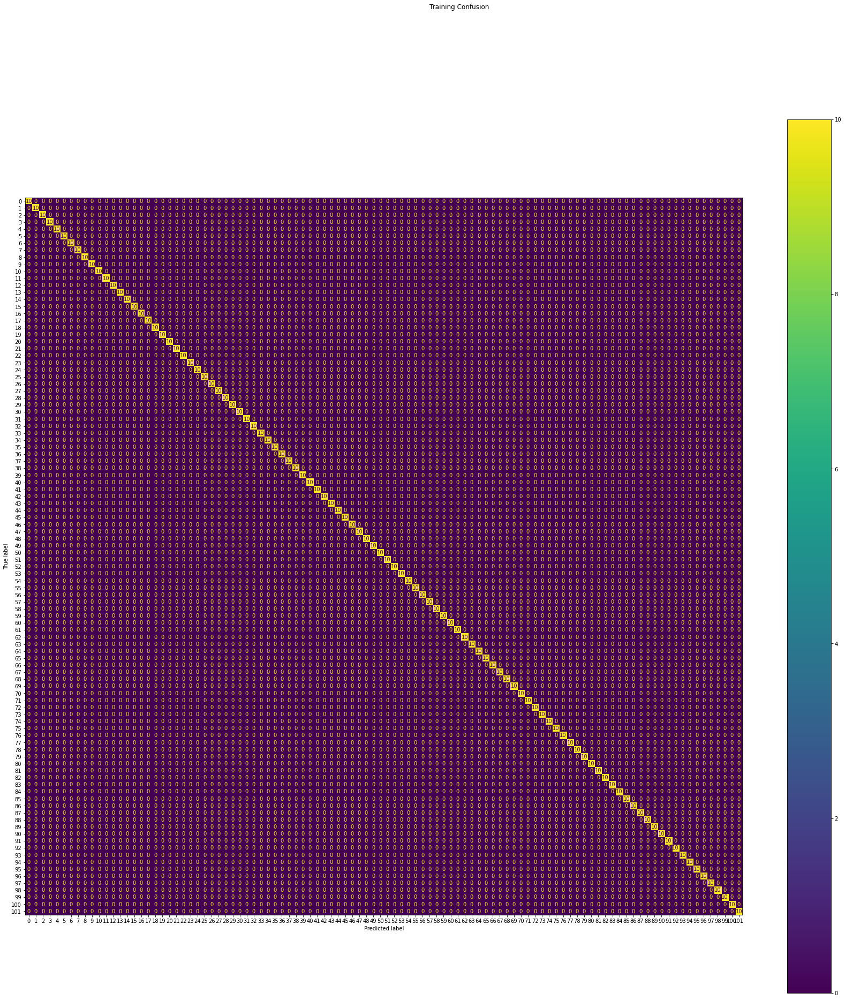

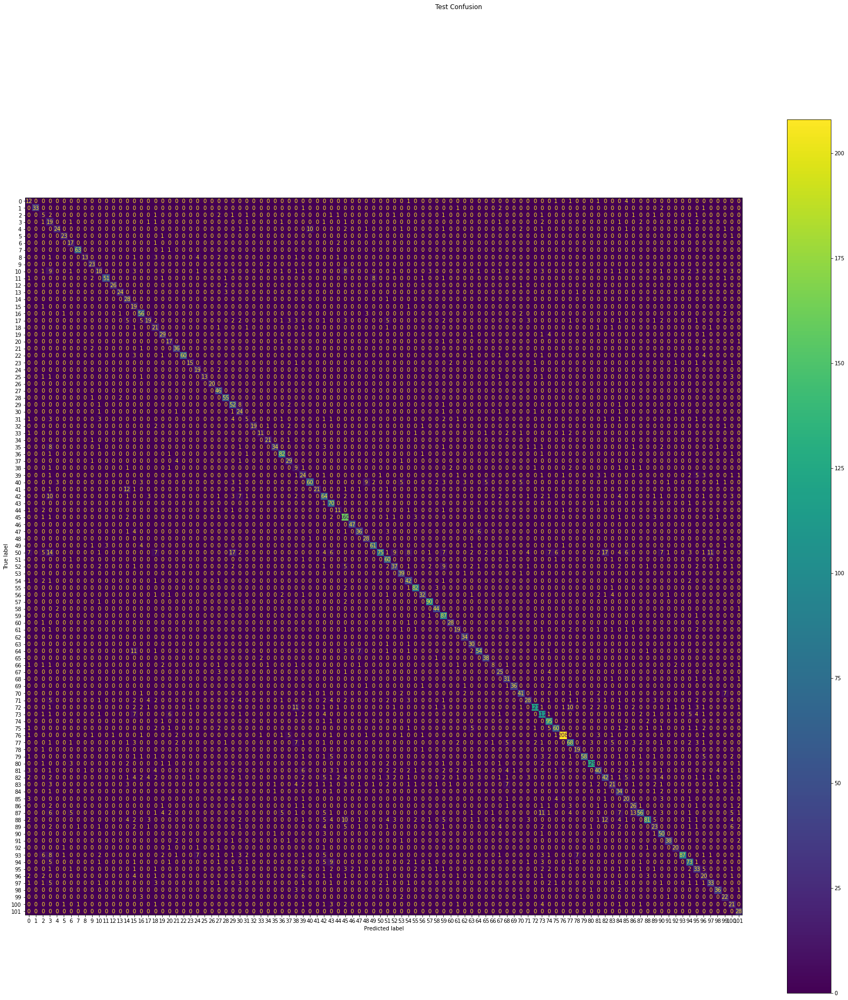

In [ ]:
# Plot Confusion Matrices
plot_cm(train_cm, 'Training Confusion')
plot_cm(test_cm, 'Test Confusion')

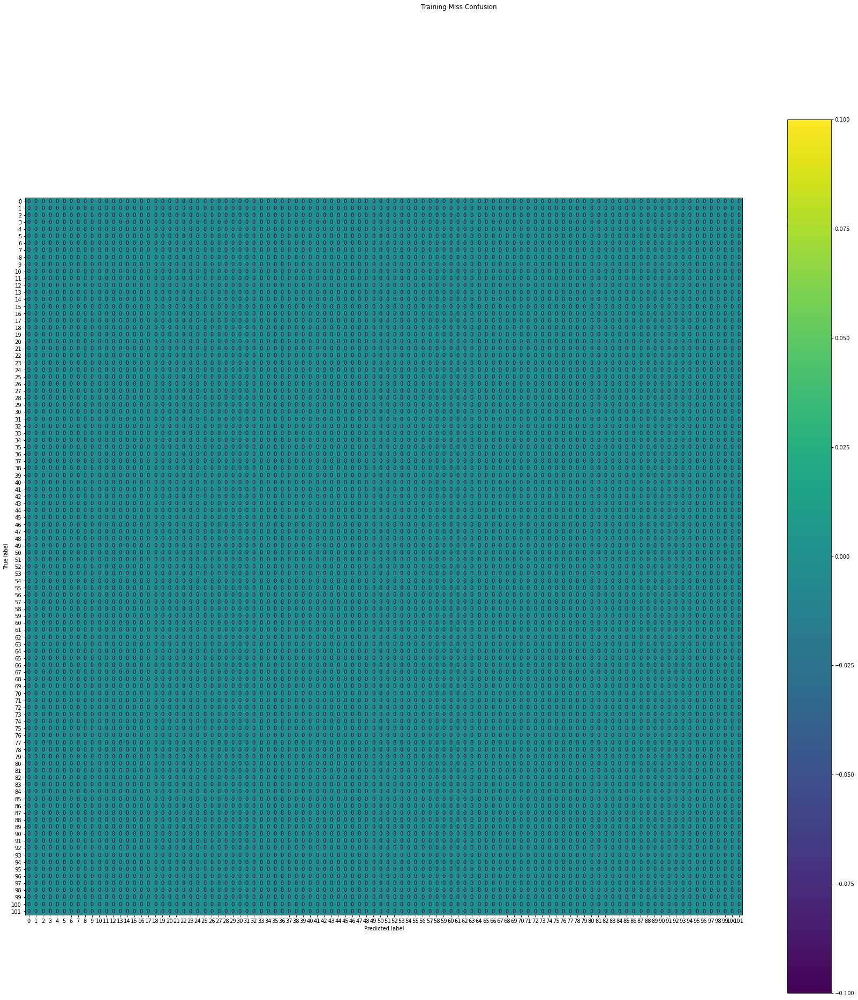

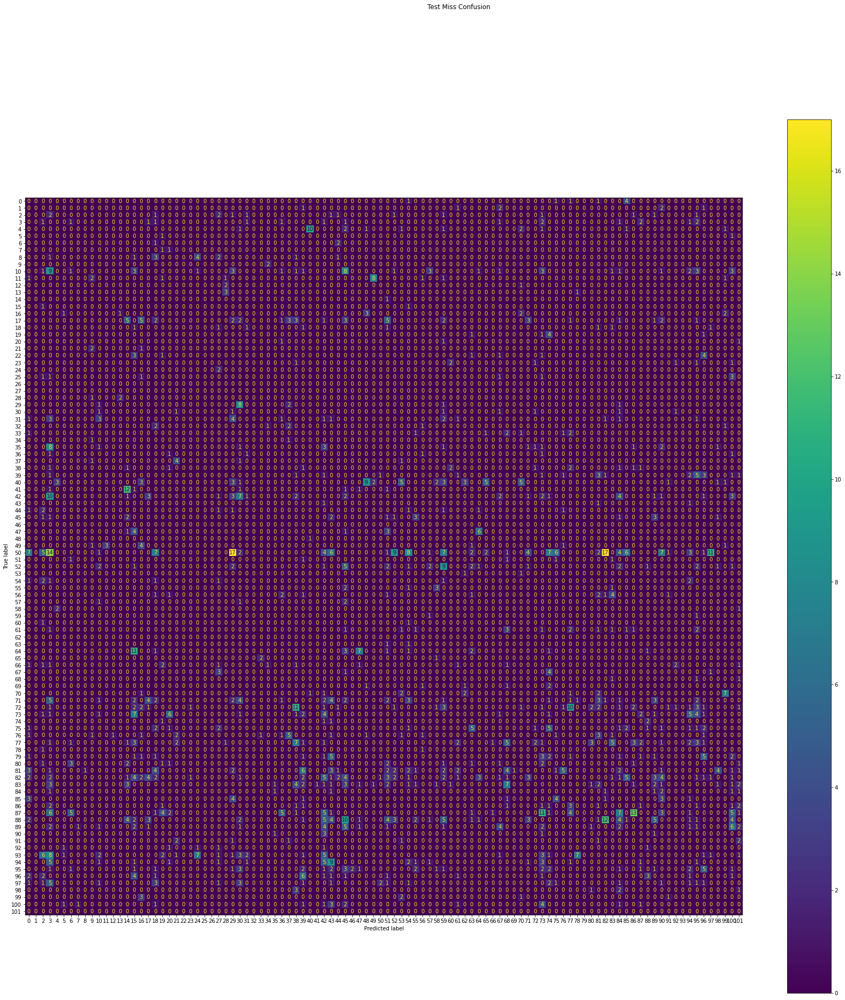

In [ ]:
# Plot Misclassification Confusion Matrices
plot_cm(train_misses_cm, 'Training Miss Confusion')
plot_cm(test_misses_cm, 'Test Miss Confusion')

In [ ]:
worst_test_misses

[(41, 14), (87, 86), (50, 3), (50, 29), (50, 82)]

In [ ]:
# Top-K class misses in training dataset
topk_train_class_misses

[(35, 0), (34, 0), (36, 0), (33, 0), (101, 0)]

In [ ]:
# Top-K class misses in test dataset
topk_test_class_misses

[(93, 55), (87, 78), (82, 69), (88, 83), (50, 163)]

In [ ]:
# Plot test misses
plot_dataset(test_misses_ds.shuffle(100), 10, 'Test Misses')

plt.figure()

# Plot Worst Misses
pds = worst_test_sample_results.map(lambda x,y,z: (x, [y,z]))
plot_dataset(pds, 15, 'Worst between-class mismatches')

Output hidden; open in https://colab.research.google.com to view.

<Figure size 1152x1152 with 0 Axes>

<Figure size 432x288 with 0 Axes>

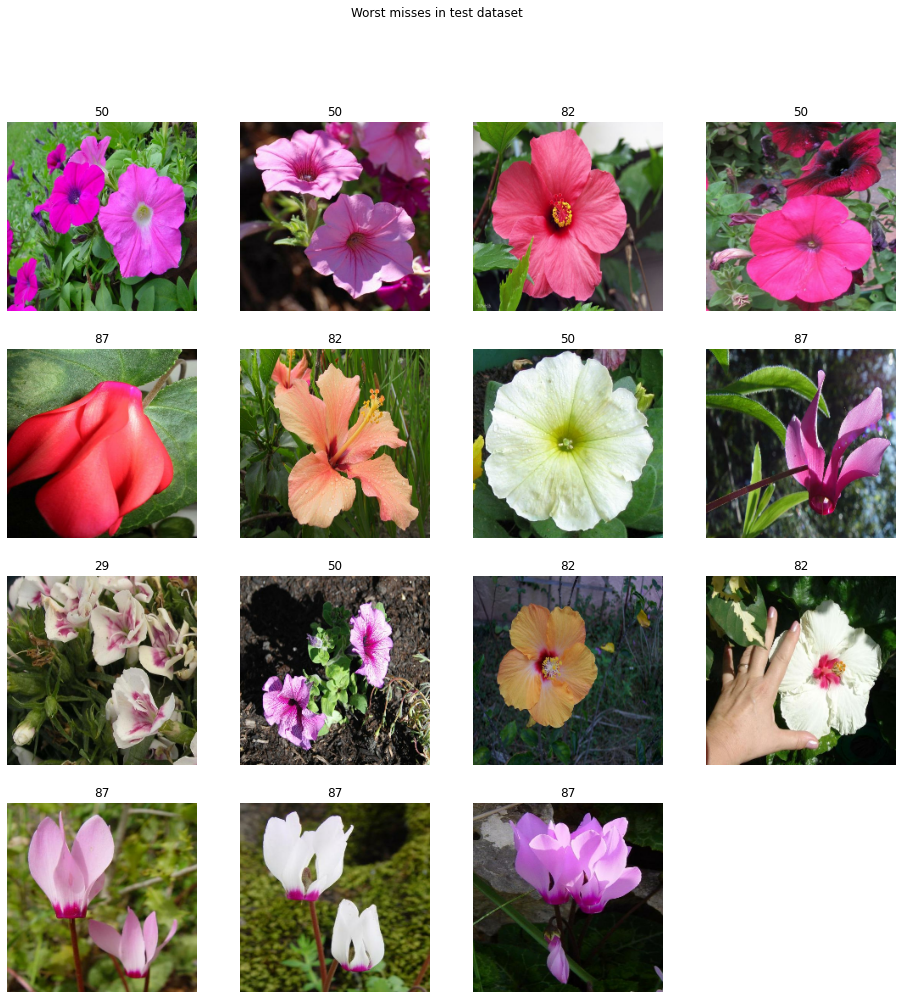

In [ ]:
# Plot training data for worst misses
plot_dataset(worse_misses_train_ds, 15, 'Worst between-class misses in training dataset')

plt.figure()
plot_dataset(worse_misses_test_ds, 15, 'Worst between-class misses in test dataset')

<Figure size 1152x864 with 0 Axes>

<Figure size 432x288 with 0 Axes>

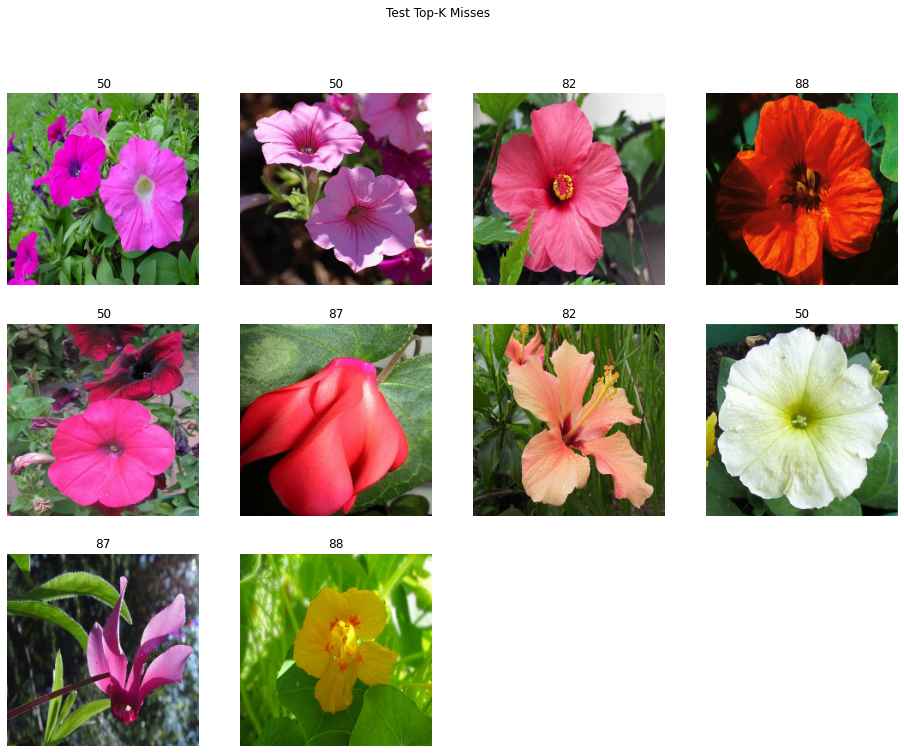

In [ ]:
# Top-K Misses
plot_dataset(train_topk_misses_ds, 10, 'Train Top-K Misses')

plt.figure()
plot_dataset(test_topk_misses_ds, 10, 'Test Top-K Misses')

## Bench

In [ ]:
print('Training Set: Min Classes: ', len(train_mincs))
for item in train_mincs: print(item)

print('Test Set: Min Classes: ', len(test_mincs))
for item in test_mincs: print(item)

Training Set: Min Classes:  0
Test Set: Min Classes:  0


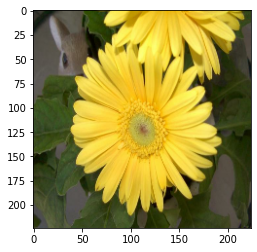

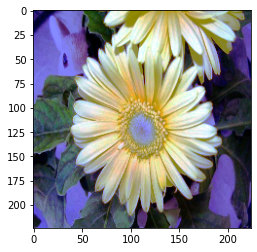

In [ ]:
sample, label = iter(samples).next()
plt.imshow(sample)

def plot_gaussian(sample, sigma=2, shape=3):
  plt.figure()
  aug = tfa.image.gaussian_filter2d(sample, filter_shape=shape, sigma=sigma)
  plt.imshow(aug)

def plot_equalize(sample):
  plt.figure()
  aug = tfa.image.equalize(sample)
  plt.imshow(aug)

plot_equalize(sample)